# Read & Plot IOOS QARTOD Test Flags from .csv Files
- This notebook is an adaptation from QartodTestExample_WaterLevel.ipynb found on the GitHub ioos_qc repository.

# Setup

In [ ]:
# Install QC library
!pip install git+git://github.com/ioos/ioos_qc.git
from ioos_qc.config import QcConfig
from ioos_qc import qartod
from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file, output_notebook
output_notebook()

In [ ]:
# Other imports
import pandas as pd
import numpy as np
from datetime import datetime

from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file, output_notebook
output_notebook()

In [4]:
# Method to plot QC results using Bokeh
def plot_results(data, var_name, results, title, test_name):

    time = data['observationDate'] #'time'
    obs = data[var_name]
    qc_test = results['qartod'][test_name]

    qc_pass = np.ma.masked_where(qc_test != 1, obs)
    qc_suspect = np.ma.masked_where(qc_test != 3, obs)
    qc_fail = np.ma.masked_where(qc_test != 4, obs)
    qc_notrun = np.ma.masked_where(qc_test != 2, obs)

    p1 = figure(x_axis_type="datetime", title=test_name + ' : ' + title)
    p1.grid.grid_line_alpha=0.3
    p1.xaxis.axis_label = 'Time'
    p1.yaxis.axis_label = 'Observation Value'

    p1.line(time, obs,  legend='obs', color='#A6CEE3')
    p1.circle(time, qc_notrun, size=2, legend='qc not run', color='gray', alpha=0.2)
    p1.circle(time, qc_pass, size=4, legend='qc pass', color='green', alpha=0.5)
    p1.circle(time, qc_suspect, size=4, legend='qc suspect', color='orange', alpha=0.7)
    p1.circle(time, qc_fail, size=6, legend='qc fail', color='red', alpha=1.0)

    #output_file("qc.html", title="qc example")

    show(gridplot([[p1]], plot_width=800, plot_height=400))


## Data: Dissolved Oxygen
### Station 101: LUMCON Marine Center, LA
### Coordinates: 29.2533, -90.6633
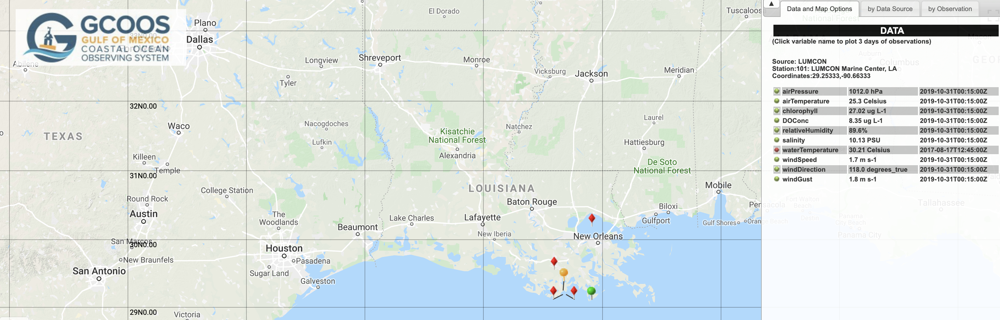

In [5]:
filename = 'gcoos_2019-10-29.csv'
variable_name='DO'
# QC configuration
# This configuration is used to call the corresponding method in the ioos_qc library
# See documentation for description of each test and its inputs: 
#   https://ioos.github.io/ioos_qc/api/ioos_qc.html#module-ioos_qc.qartod
qc_config = {
    'qartod': {
      "gross_range_test": {
        "fail_span": [0,100],
        "suspect_span": [0,15]
      },
      "flat_line_test": {
        "tolerance": 0.00,
        "suspect_threshold": 1000,
        "fail_threshold": 2000
      },
      "rate_of_change_test": {
        "threshold": 0.001
      },
      "spike_test": {
        "suspect_threshold": 3,
        "fail_threshold": 4
      }
    }
}

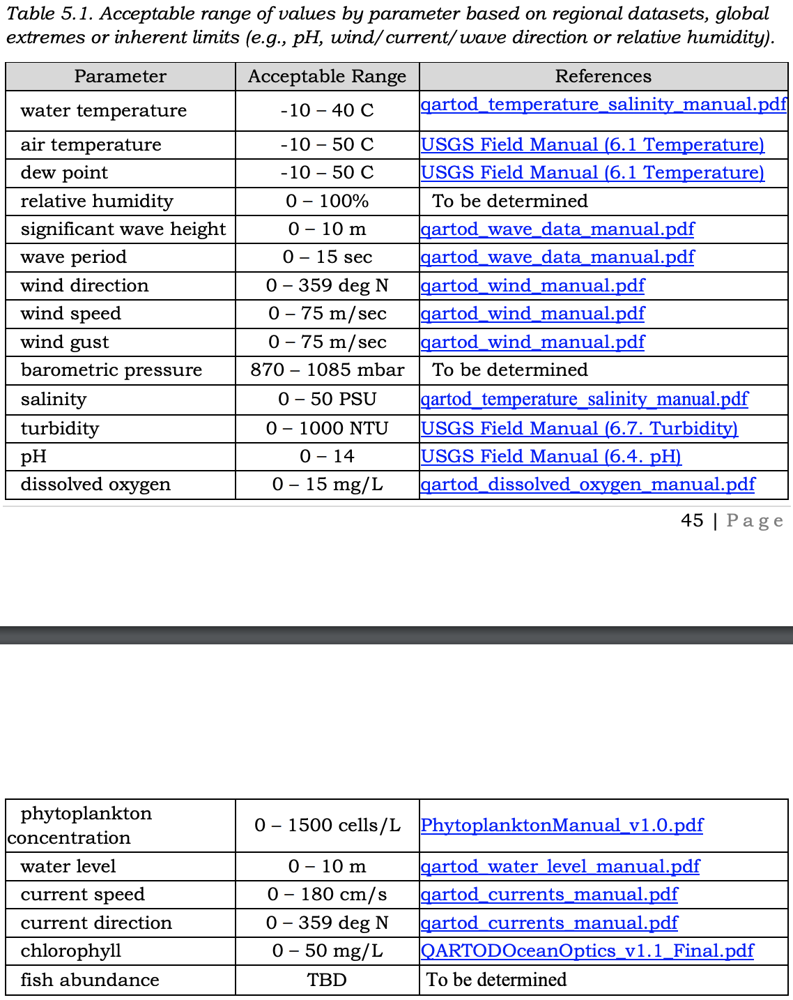

# Load data

In [ ]:
# Load data
data = pd.read_csv(filename, parse_dates=['observationDate']) # 'time'

# Run tests 

### Flag system:
````
Flag Meaning
1:    Pass
2:    Unknown
3:    Suspect
4:    Fail 
9:    Missing
````

In [ ]:
# Run QC
qc = QcConfig(qc_config)
qc_results =  qc.run(
    inp=data[variable_name],
    tinp=data['observationDate'],
    zinp=data['qcFlag ']
)
all_tests = [qc_results['qartod'][test_name] for test_name in qc_results['qartod'].keys()]
qc_results['qartod']['qc_agg'] = qartod.qartod_compare(all_tests).astype(int)

In [8]:
qc_results

OrderedDict([('qartod',
              OrderedDict([('gross_range_test',
                            masked_array(data=[1, 1, 1, ..., 1, 1, 9],
                                         mask=False,
                                   fill_value=999999,
                                        dtype=uint8)),
                           ('flat_line_test', array([1, 1, 1, ..., 1, 1, 9])),
                           ('rate_of_change_test',
                            masked_array(data=[1, 1, 1, ..., 1, 1, 9],
                                         mask=False,
                                   fill_value=999999,
                                        dtype=uint8)),
                           ('spike_test',
                            masked_array(data=[4, 1, 1, ..., 1, 1, 9],
                                         mask=False,
                                   fill_value=999999,
                                        dtype=uint8)),
                           ('qc_agg',
                   

### Note:
1. Develop and create automated test for measurements √
    - Contrary to OOI QARTOD has no qc-look up table for ocean variables. 
    - There are few metrics found in the QARTOD manuals but it is far from being inclusive.
    

3. Establish a data flag system or a data annotation service to communicate results V

# Plot results

In [9]:
# Plot results
#title = "Water Level [MHHW] [m] : Kotzebue, AK"
title = "Dissolved Oxygen"

plot_results(data, variable_name, qc_results, title, 'gross_range_test')

In [10]:
plot_results(data, variable_name, qc_results, title, 'flat_line_test')

In [11]:
plot_results(data, variable_name, qc_results, title, 'rate_of_change_test')

In [12]:
plot_results(data, variable_name, qc_results, title, 'spike_test')

In [13]:
# QC Aggregate flag
plot_results(data, variable_name, qc_results, title, 'qc_agg')

### Note: 
#### 2. Examine test results to identify and address the errors and omissions X
    - There is a need to establish this step in the data QC activities using Human In the Loop (HIL) element. 

    - The summary flag is proposed as a way to add the HIL results
##### Example: 
    5 automated QC tests and on Failed - QC flags will be as follow [1 1 4 1 1] 
    and the summary flag would be set to 4 (Fail).
    
    HIL established the Faild test to be in error, so the summery flag is changed to 1, but the individual test flags are left alone. This enables to preserve the automated test results, so the process can be reproduced. 
    
    
#### 4. Document all QC activities to ensure data correctness, completeness, and reuse X
    - This is not captured in the data file metadata and 
    - There is not yet an established standarized way to communicate this information to users.  
    
    
    
see paper by Mark Bushnell et al., 2018
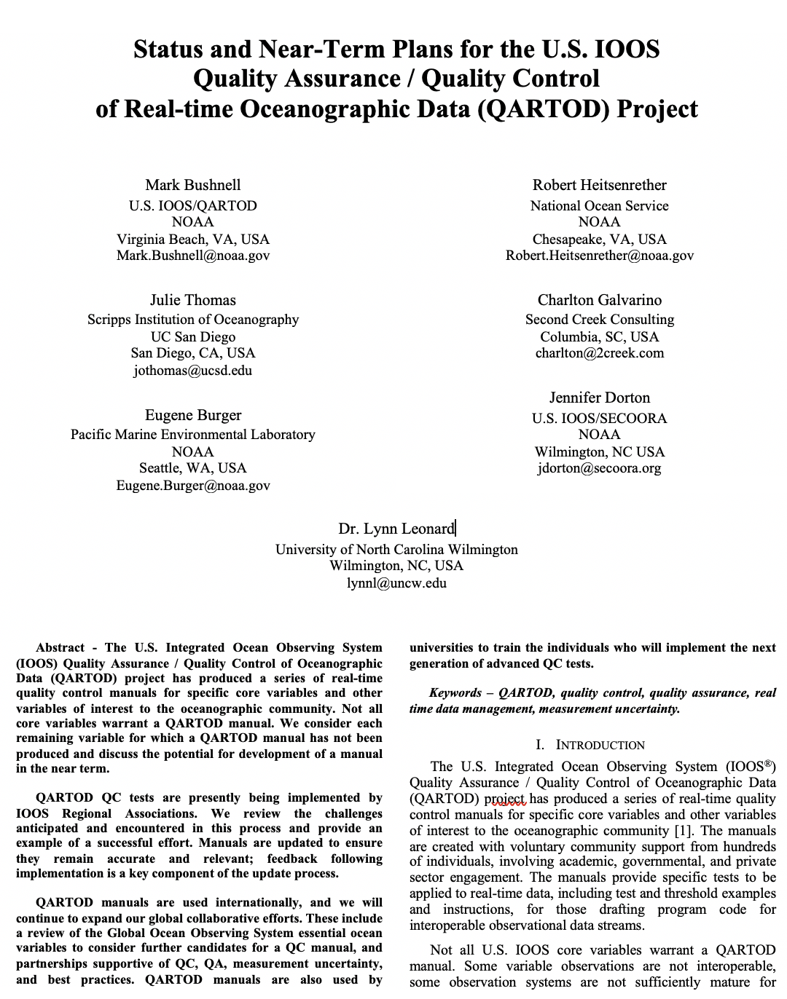

# END